In [1]:
#Voice Separation, using machine learning

In [1]:
import matplotlib.pyplot as plt
import numpy as np
import pylab as pl

from scipy import signal
from scipy.io import wavfile
from IPython.display import Audio
from sklearn.decomposition import PCA
from sklearn.decomposition import FastICA

path = 'test.wav'


In [2]:
def pca_reduce(signal, n_components, block_size=1024):
    
    # First, zero-pad the signal so that it is divisible by the block_size
    samples = len(signal)
    hanging = block_size - np.mod(samples, block_size)
    padded = np.lib.pad(signal, (0, hanging), 'constant', constant_values=0)
    
    # Reshape the signal to have 1024 dimensions
    reshaped = padded.reshape((len(padded) // block_size, block_size))
    
    # Second, do the actual PCA process
    pca = PCA(n_components=n_components)
    pca.fit(reshaped)
    
    transformed = pca.transform(reshaped)
    reconstructed = pca.inverse_transform(transformed).reshape((len(padded)))
    return pca, transformed, reconstructed

def show_grap(samples):
#     sample_rate, samples = wavfile.read(path)
#     samples = samples.sum(axis=1) / 2
#     samples = samples[:sample_rate * 17]
    plt.figure(1)
    plt.title('Signal Wave...')
    plt.plot(samples)
    plt.show()

In [213]:
Audio(data=samples, rate=sample_rate)

In [214]:
_, _, reconstructed = pca_reduce(samples, 1, 4)

Audio(data=reconstructed, rate=sample_rate)

In [216]:
fs_1, voice_1 = wavfile.read("mixedTest1.wav")
fs_2, voice_2 = wavfile.read("mixedTest2.wav")
m, = voice_1.shape
voice_2 = voice_2[:m]
S = np.c_[voice_2, voice_1]
A = np.array([[0.8, 0.9], [0.005, 0.62]])  # Mixing matrix
X = np.dot(S, A.T)  # Generate observations
ica = FastICA()
S_ = ica.fit(X).transform(X)  # Get the estimated sources
A_ = ica.mixing_  # Get estimated mixing matrix
np.allclose(X, np.dot(S_, A_.T))
multiply_factor = 1000000 ;

temp_output_1 = multiply_factor*S_[:,0]
temp_output_2 = multiply_factor*S_[:,1]

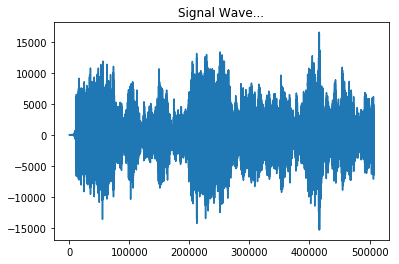

In [217]:
show_grap(voice_1)

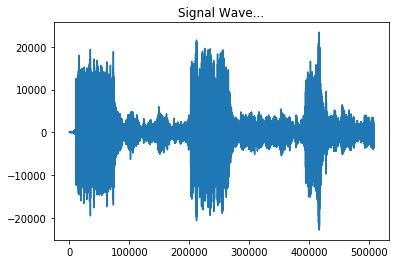

In [218]:
show_grap(voice_2)

In [145]:
Audio(data=temp_output_1, rate=sample_rate)

In [146]:
Audio(data=temp_output_2, rate=sample_rate)

In [219]:
Audio(data=voice_1, rate=sample_rate)

In [148]:
Audio(data=voice_2, rate=sample_rate)

In [26]:
sample_rate, voice_3 = wavfile.read("test12.wav")

In [27]:
# _, _, voice_1 = pca_reduce(voice_3[:, 0], 500, 500)
# _, _, voice_2 = pca_reduce(voice_3[:, 1], 500, 500)
voice_1 = voice_3[:, 0]
voice_2 = voice_3[:, 1]



In [28]:
voice_1

array([-2, -2, -1, ...,  0,  0,  0], dtype=int16)

In [29]:
voice_2

array([-1, -1, -1, ...,  0,  0,  0], dtype=int16)

In [30]:
Audio(data=voice_1, rate=sample_rate)

In [31]:
Audio(data=voice_2, rate=sample_rate)

In [32]:
S = np.c_[voice_2, voice_1]
A = np.array([[0.3816, 0.8678], [0.8534, -0.5853]])  # Mixing matrix
X = np.dot(S, A.T)  # Generate observations

In [33]:
ica = FastICA()
S_ = ica.fit(X).transform(X)  # Get the estimated sources
A_ = ica.mixing_  # Get estimated mixing matrix
np.allclose(X, np.dot(S_, A_.T))

False

In [34]:
multiply_factor = 1000000 ;

temp_output_1 = multiply_factor*S_[:,0]
temp_output_2 = multiply_factor*S_[:,1]

In [35]:
temp_output_1

array([1.02845138, 1.02845138, 0.31877156, ..., 0.02654176, 0.02654176,
       0.02654176])

In [36]:
temp_output_2

array([-0.41162151, -0.41162151, -1.20470227, ..., -0.65955004,
       -0.65955004, -0.65955004])

In [37]:
Audio(data=temp_output_1, rate=sample_rate)

In [38]:
Audio(data=temp_output_2, rate=sample_rate)

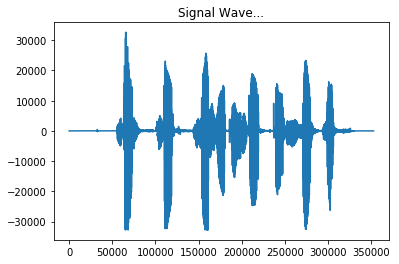

In [39]:
show_grap(voice_1)

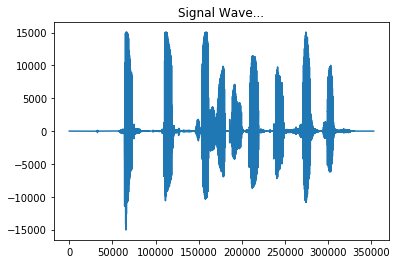

In [40]:
show_grap(temp_output_1)

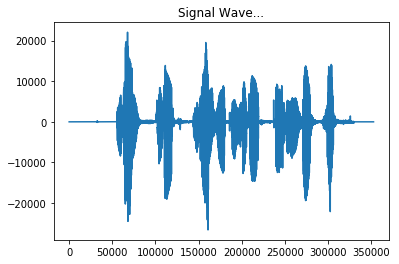

In [41]:
show_grap(voice_2)

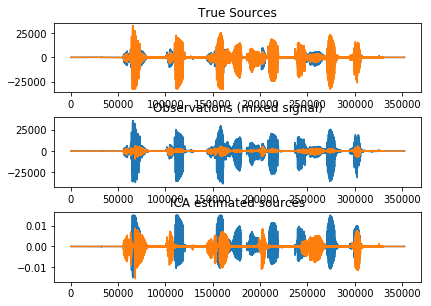

In [42]:
pl.figure()
pl.subplot(3, 1, 1)
pl.plot(S)
pl.title('True Sources')
pl.subplot(3, 1, 2)
pl.plot(X)
pl.title('Observations (mixed signal)')
pl.subplot(3, 1, 3)
pl.plot(S_)
pl.title('ICA estimated sources')
pl.subplots_adjust(0.09, 0.04, 0.94, 0.94, 0.26, 0.36)
pl.show()